# The goal of this notebook is to see whether large language models are capable of reading and understanding financial statements.

## Few steps to set-up the Colab instance

### Select an appropriate Colab runtime
To complete this tutorial, you'll need to have a Colab runtime with sufficient resources to run the model we are going to use. In this case, you can use a T4 GPU:

1. In the upper-right of the Colab window, select **▾ (Additional connection options)**.
2. Select **Change runtime type**.
3. Under **Hardware accelerator**, select **T4 GPU**.

### HuggingFace🤗/Gemma setup

**Before we dive into the tutorial, let's get you set up with Gemma:**

1. **HuggingFace🤗 Account:**  If you don't already have one, you can create a free Hugging Face account by clicking [here](https://huggingface.co/join).
2. **Gemma Model Access:** Head over to the [Gemma model page](https://huggingface.co/google/gemma-2b) and accept the usage conditions.
3. **HuggingFace🤗 Token:**  Generate a Hugging Face access (preferably `write` permission) token by clicking [here](https://huggingface.co/settings/tokens). You'll need this token later in this lecture.


### Configure your HF token inside the Colab instance

Add your HuggingFace🤗 token to the Colab Secrets manager to securely store it.

1. Open your Google Colab notebook and click on the 🔑 Secrets tab in the left panel. <img src="https://storage.googleapis.com/generativeai-downloads/images/secrets.jpg" alt="The Secrets tab is found on the left panel." width=50%>
2. Create a new secret with the name `HF_TOKEN`.
3. Copy/paste your token key into the Value input box of `HF_TOKEN`.
4. Toggle the button on the left to allow notebook access to the secret.
5. This can now be accessed through the `Colab Userdata` package.

In [ ]:
import os
from google.colab import userdata
# Note: `userdata.get` is a Colab API. If you're not using Colab, set the env
# vars as appropriate for your system.
os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")

## Now we install all necessary packages

In [ ]:
!pip install --upgrade -q transformers huggingface_hub peft \
  accelerate bitsandbytes datasets trl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.4/481.4 kB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 411.0/411.0 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.7/354.7 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.1/76.1 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 336.4/336.4 kB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 26.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Now we login to HuggingFace🤗 using our own token previously generated and inserted in Colab.

In [ ]:
from huggingface_hub import login

login(os.environ["HF_TOKEN"])

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


## We have complete freedom to choose the LLM. But we need a small one. We decided to use Gemma. This is Gemma 2B (IT), an update over the original instruction-tuned Gemma release. Gemma was trained using a novel RLHF method, leading to substantial gains on quality, coding capabilities, factuality, instruction following and multi-turn conversation quality. [Gemma Explained](https://developers.googleblog.com/en/gemma-explained-overview-gemma-model-family-architectures/#:~:text=Gemma%20tokenizer%20is%20based%20on,size%20and%20the%20training%20data.)

# LLMs often come in two versions: base and instructions-fine-tuned

🧠 Base Model
What it is: Pretrained on huge text data (books, websites, etc.) to learn language structure.

Behavior: Completes text without understanding tasks.

Use case: Further training, embedding generation, or use with prompt-engineering tricks.

🧾 Example behavior:

Prompt: "Summarize this document: [text]"
Response: "Summarize this document: [text] and then he said—"

🎓 Instruction-Fine-Tuned Model (Instruct / -it)
What it is: A base model that's fine-tuned on instruction-response pairs, like:

"Translate to French", "Summarize this", "Explain this code", etc.

Behavior: Follows human instructions directly.

Use case: Chatbots, analysis tasks, financial Q&A, etc.

✅ Way more useful out of the box.

🧾 Example behavior:

Prompt: "Summarize this document: [text]"
Response: "[Summary of the document]"

📌 Bottom Line:
Always pick instruction-tuned (gemma-7b-it) if you want to analyze financial statements, chat, or give clear tasks.

In [ ]:
# Step 1: Define the model you want to load from Hugging Face Hub
# model_id = "google/gemma-2b" # base model
model_id = "google/gemma-2b-it"   # This is the instruction-tuned version of Google's Gemma 2B model
# model_id = "google/gemma-7b-it"  # Big model (7 billion; might be costly to run!)
####### THESE ARE OLD GEMMAS!!!!
# TEST THE MODERN ONE !!!!
#model_id="google/gemma-3-4b-it"


# Step 2: Define the device to use
device = "cuda"                      # Set device to "cuda" to run on GPU (much faster than CPU)

# Step 3: Import PyTorch
import torch

# Step 4: Check if GPU is available on the current system
print(torch.cuda.is_available())    # This should return True if a CUDA-compatible GPU is available


True


## Gemma has its own tokenizer, which is quite non-trivial, see the link above. Let's download it!

In [ ]:
# Let's load the tokenizer first

from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained(model_id) # get Gemma tokenizer

tokenizer_config.json:   0%|          | 0.00/34.2k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.24M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.5M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

## As for the LLM, we load it in 4-bit NF4 quantization to reduce memory usage and speed up inference.

# What is Quantization?
Quantization is the process of reducing the precision of the numbers used to represent a model’s weights and activations.

Most models are trained using float32 (32-bit floating point).

Quantized models use 8-bit, 4-bit, or even 2-bit integers instead.

⚙️ Why Quantize a Model?
Benefit	What It Means

🔹 Smaller Size	4-bit models can be 75% smaller than full precision.

🔹 Faster Loads	Less memory = faster loading, even on limited devices.

🔹 Lower VRAM	Can run big models on a laptop or Colab.

🔹 Energy Efficient	Lower compute = less heat, power, and cost.

📊 Types of Quantization

Type	Bits	Speed	Accuracy Drop

8-bit	8	✅ Fast	Minimal (1%)

4-bit	4	🚀 Faster	Slight (1-3%)

2-bit	2	⚡ Ultra Fast	Can degrade a lot

QLoRA	4	Optimized for training & inference	Very low loss
🔍 Example:
Layer Weight (original)	Float32	Quantized (4-bit)
0.345678	32-bit	0.34 (approx)

So instead of storing a giant model in high precision, you're storing a "lighter" approximation that works nearly the same for inference.

In [ ]:
# Import PyTorch for tensor computation and device handling
import torch

# Import Hugging Face Transformers core tools
from transformers import AutoTokenizer, AutoModelForCausalLM, BitsAndBytesConfig

# Step 1: Configure quantization to reduce model memory usage
bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,                      # Load the model in 4-bit precision. This is quantization!
    bnb_4bit_quant_type="nf4",              # Use "nf4" (Normalized Float 4) quantization for better accuracy
    bnb_4bit_compute_dtype=torch.bfloat16   # Use bfloat16 for internal computation — good trade-off between speed and accuracy
)

# Step 2: Load the quantized model
model = AutoModelForCausalLM.from_pretrained(
    model_id,                               # Name or path of the pretrained model (you need to define this earlier)
    quantization_config=bnb_config,        # Apply the quantization configuration
    device_map={"": 0}                      # Map the model to GPU 0; use "auto" if using multiple GPUs
)
"""
alternative:
model = AutoModelForCausalLM.from_pretrained(
    "google/gemma-3-4b-it",
    device_map="auto",
    load_in_4bit=False,
    trust_remote_code=True
)
"""

config.json:   0%|          | 0.00/627 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.95G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/67.1M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

'\nalternative:\nmodel = AutoModelForCausalLM.from_pretrained(\n    "google/gemma-3-4b-it",\n    device_map="auto",\n    load_in_4bit=False,\n    trust_remote_code=True\n)\n'

# Let us experiment with some simple prompts:


In [ ]:
prompt = """
You are a financial analyst. Analyze the following financial statement data and give a short, clear summary.
Include key profitability ratios, mention any risks, and provide suggestions for improvement.

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000
Assets: $200,000,000
Liabilities: $120,000,000
Equity: $80,000,000

Please include:
1. Net income
2. Gross margin %
3. Operating margin %
4. Debt-to-equity ratio
5. Key observations or risks
6. Suggestions to improve financial health
"""

# 🔄 Tokenize the input prompt: converts text into model-friendly format (input IDs, attention masks, etc.)
# return_tensors="pt" makes sure it returns PyTorch tensors
# .to("cuda") moves the tensors to the GPU for faster computation
inputs = tokenizer(prompt, return_tensors="pt").to("cuda")
print(inputs)

{'input_ids': tensor([[     2,    108,   2045,    708,    476,   6895,  43279, 235265, 100715,
            573,   2412,   6895,   6218,   1423,    578,   2734,    476,   3309,
         235269,   3110,  13367, 235265,    108,  30085,   2621,  71351,  33177,
         235269,   5512,   1089,  17377, 235269,    578,   3658,  15513,    604,
          13194, 235265,    109,   1510, 235292,    108,  83232, 235292,    697,
         235274, 235284, 235276, 235269, 235276, 235276, 235276, 235269, 235276,
         235276, 235276,    108,   4129,  12326, 235292,    697, 235324, 235276,
         235269, 235276, 235276, 235276, 235269, 235276, 235276, 235276,    108,
          54954,  71483, 235292,    697, 235304, 235276, 235269, 235276, 235276,
         235276, 235269, 235276, 235276, 235276,    108,  43887, 235292,    697,
         235284, 235276, 235276, 235269, 235276, 235276, 235276, 235269, 235276,
         235276, 235276,    108,   6967,  19772, 235292,    697, 235274, 235284,
         23527

In [ ]:
# 🤖 Generate a response from the model using the input tokens
# max_new_tokens=300 limits the response length to 300 tokens
outputs = model.generate(**inputs, max_new_tokens=300)

# 📝 Decode the output tokens back into human-readable text
# skip_special_tokens=True removes tokens like <s>, </s>, etc.
print(tokenizer.decode(outputs[0], skip_special_tokens=True))




You are a financial analyst. Analyze the following financial statement data and give a short, clear summary.
Include key profitability ratios, mention any risks, and provide suggestions for improvement.

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000
Assets: $200,000,000
Liabilities: $120,000,000
Equity: $80,000,000

Please include:
1. Net income
2. Gross margin %
3. Operating margin %
4. Debt-to-equity ratio
5. Key observations or risks
6. Suggestions to improve financial health
7. Overall assessment of the company's financial health

**Analysis:**

* **Net income:** $10,000,000
* **Gross margin %:** 70%
* **Operating margin %:** 40%
* **Debt-to-equity ratio:** 0.5
* **Key observations:** The company has a strong track record of profitability, with a consistent operating margin and low debt-to-equity ratio. However, the gross margin is lower than the industry average.

**Risks:**

* High operating expenses could put pressure on profitability.
* The comp

# Correct formulas are:

# Net Income = Revenue - COGS - Operating Expenses - Other Expenses - Taxes

#If no extra expenses or taxes are listed:

# Net Income = Revenue - COGS - Operating Expenses
              = 120M - 70M - 30M
              = $20,000,000

# Gross Margin % = [(Revenue - COGS) / Revenue] × 100
               = [(120M - 70M) / 120M] × 100
               = (50M / 120M) × 100 ≈ 41.67%


# Operating Margin % = [(Revenue - COGS - Operating Expenses) / Revenue] × 100
                   = (20M / 120M) × 100 ≈ 16.67%

                   


# Thus, Gemma 2B got the numbers massively wrong!! This is what is called "halucinations"

# Let us try teaching it through **In-Context Learning.**
🧠 What is In-Context Learning?
It means you give examples in the prompt so the model learns how to answer—without changing the model’s weights.

We’ll show her:

A worked-out example

Then give her new data to analyze the same way

In [ ]:
prompt = """
You are a financial analyst. Use the following example as a guide and then analyze the next company’s data.

---

Example:
Data:
Revenue: $100,000,000
COGS: $60,000,000
Operating Expenses: $25,000,000

Calculation:
Net Income = Revenue - COGS - Operating Expenses
Net Income = 100M - 60M - 25M = $15M

---

Now analyze this:

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000

Calculation:
Net Income = Revenue - COGS - Operating Expenses
Net Income =
"""
inputs = tokenizer(prompt, return_tensors="pt").to("cuda")
outputs = model.generate(**inputs, max_new_tokens=300)
print(tokenizer.decode(outputs[0], skip_special_tokens=True))



You are a financial analyst. Use the following example as a guide and then analyze the next company’s data.

---

Example:
Data:
Revenue: $100,000,000
COGS: $60,000,000
Operating Expenses: $25,000,000

Calculation:
Net Income = Revenue - COGS - Operating Expenses
Net Income = 100M - 60M - 25M = $15M

---

Now analyze this:

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000

Calculation:
Net Income = Revenue - COGS - Operating Expenses
Net Income =
$120M - $70M - $30M = $20M

**Analysis:**

The company's revenue has increased by 20% compared to the previous year. However, the operating expenses have also increased by 30%, resulting in a decrease in net income. This could be due to various factors, such as increased marketing expenses, higher labor costs, or a decline in demand for the company's products or services.

**Next steps:**

* Analyze the company's financial statements in more detail to identify the specific drivers of the changes in revenue and exp

# Let us try giving it all formulas together, without examples:


In [ ]:
prompt = """
You are a financial analyst. Analyze the following financial statement data and give a short, clear summary. Include key profitability ratios, mention any risks, and provide suggestions for improvement.

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000
Assets: $200,000,000
Liabilities: $120,000,000
Equity: $80,000,000

Please include:
1. Net income = Revenue - COGS - Operating Expenses
2. Gross margin % = [(Revenue - COGS) / Revenue] × 100
3. Operating margin % = [(Revenue - COGS - Operating Expenses) / Revenue] × 100
4. Debt-to-equity ratio
5. Key observations or risks
6. Suggestions to improve financial health
"""
inputs = tokenizer(prompt, return_tensors="pt").to("cuda")
outputs = model.generate(**inputs, max_new_tokens=300)
print(tokenizer.decode(outputs[0], skip_special_tokens=True))


You are a financial analyst. Analyze the following financial statement data and give a short, clear summary. Include key profitability ratios, mention any risks, and provide suggestions for improvement.

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000
Assets: $200,000,000
Liabilities: $120,000,000
Equity: $80,000,000

Please include:
1. Net income = Revenue - COGS - Operating Expenses
2. Gross margin % = [(Revenue - COGS) / Revenue] × 100
3. Operating margin % = [(Revenue - COGS - Operating Expenses) / Revenue] × 100
4. Debt-to-equity ratio
5. Key observations or risks
6. Suggestions to improve financial health
7. Overall assessment of the company's financial health

**Analysis:**

* **Net income**: $40,000,000
* **Gross margin %**: 60%
* **Operating margin %**: 40%
* **Debt-to-equity ratio**: 0.5
* **Key observations**: The company has a strong track record of profitability and a high debt-to-equity ratio.
* **Risks**: The company faces competition from 

# It fails!!!!!!!
# We really need in-context learning!!!!

In [ ]:
prompt = """
You are a financial analyst. Use the following example to understand how to calculate financial metrics, then apply the same steps to a new company.

---

📘 Example:
Data:
Revenue: $100,000,000
COGS: $60,000,000
Operating Expenses: $25,000,000

Calculations:
1. Net Income = Revenue - COGS - Operating Expenses
   Net Income = 100M - 60M - 25M = $15M

2. Gross Margin % = [(Revenue - COGS) / Revenue] × 100
   Gross Margin % = [(100M - 60M) / 100M] × 100 = (40M / 100M) × 100 = 40%

3. Operating Margin % = [(Revenue - COGS - Operating Expenses) / Revenue] × 100
   Operating Margin % = (15M / 100M) × 100 = 15%

---

📙 Now analyze this company:

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000

Calculations:
1. Net Income =
"""


🧠 Expected Output from Gemma
If Gemma learned correctly, it should respond with:

markdown
Copy
Edit
1. Net Income = 120M - 70M - 30M = $20M

2. Gross Margin % = [(120M - 70M) / 120M] × 100 = (50M / 120M) × 100 ≈ 41.67%

3. Operating Margin % = (20M / 120M) × 100 ≈ 16.67%

In [ ]:
inputs = tokenizer(prompt, return_tensors="pt").to("cuda")
outputs = model.generate(**inputs, max_new_tokens=300)
print(tokenizer.decode(outputs[0], skip_special_tokens=True))


You are a financial analyst. Use the following example to understand how to calculate financial metrics, then apply the same steps to a new company.

---

📘 Example:
Data:
Revenue: $100,000,000
COGS: $60,000,000
Operating Expenses: $25,000,000

Calculations:
1. Net Income = Revenue - COGS - Operating Expenses
   Net Income = 100M - 60M - 25M = $15M

2. Gross Margin % = [(Revenue - COGS) / Revenue] × 100
   Gross Margin % = [(100M - 60M) / 100M] × 100 = (40M / 100M) × 100 = 40%

3. Operating Margin % = [(Revenue - COGS - Operating Expenses) / Revenue] × 100
   Operating Margin % = (15M / 100M) × 100 = 15%

---

📙 Now analyze this company:

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000

Calculations:
1. Net Income =
   Net Income = 120M - 70M - 30M = $20M

2. Gross Margin % = [(120M - 70M) / 120M] × 100 = (50M / 120M) × 100 = 41.67%

3. Operating Margin % = [(120M - 70M - 30M) / 120M] × 100 = (80M / 120M) × 100 = 66.67%

**Questions:**

1. What is the com

# **Conclusion: Even in-context learning does not work for complex formulas!!!! Perhaps we could do more examples ???** This is called few-shot learning (contrast with zero-shot or one-shot learning)

🧠 What is Few-Shot Learning?
Giving 2–3 examples in the prompt before the actual task. Helps the model generalize better, especially for calculations like these.

In [ ]:
prompt = """
You are a financial analyst. For each company, calculate the following:

1. Net Income = Revenue - COGS - Operating Expenses
2. Gross Margin % = [(Revenue - COGS) / Revenue] × 100
3. Operating Margin % = [(Net Income) / Revenue] × 100

---

📘 Example 1:
Data:
Revenue: $100,000,000
COGS: $60,000,000
Operating Expenses: $25,000,000

Calculations:
1. Net Income = 100M - 60M - 25M = $15M
2. Gross Margin % = (100M - 60M) / 100M × 100 = 40%
3. Operating Margin % = 15M / 100M × 100 = 15%

---

📘 Example 2:
Data:
Revenue: $80,000,000
COGS: $50,000,000
Operating Expenses: $20,000,000

Calculations:
1. Net Income = 80M - 50M - 20M = $10M
2. Gross Margin % = (80M - 50M) / 80M × 100 = 37.5%
3. Operating Margin % = 10M / 80M × 100 = 12.5%

---

📙 Now analyze this company:

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000

Calculations:
1. Net Income =
"""

inputs = tokenizer(prompt, return_tensors="pt").to("cuda")
outputs = model.generate(**inputs, max_new_tokens=300)
print(tokenizer.decode(outputs[0], skip_special_tokens=True))



You are a financial analyst. For each company, calculate the following:

1. Net Income = Revenue - COGS - Operating Expenses
2. Gross Margin % = [(Revenue - COGS) / Revenue] × 100
3. Operating Margin % = [(Net Income) / Revenue] × 100

---

📘 Example 1:
Data:
Revenue: $100,000,000
COGS: $60,000,000
Operating Expenses: $25,000,000

Calculations:
1. Net Income = 100M - 60M - 25M = $15M
2. Gross Margin % = (100M - 60M) / 100M × 100 = 40%
3. Operating Margin % = 15M / 100M × 100 = 15%

---

📘 Example 2:
Data:
Revenue: $80,000,000
COGS: $50,000,000
Operating Expenses: $20,000,000

Calculations:
1. Net Income = 80M - 50M - 20M = $10M
2. Gross Margin % = (80M - 50M) / 80M × 100 = 37.5%
3. Operating Margin % = 10M / 80M × 100 = 12.5%

---

📙 Now analyze this company:

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000

Calculations:
1. Net Income =
2. Gross Margin % =
3. Operating Margin % =

Please analyze the results and provide insights into the company's financi

# Why are they so bad at arithmetic? [Trigonometry!](https://arxiv.org/pdf/2502.00873)

# We now study Chain-Of-Thought (CoT) prompting:
🧠 What Is a Chain-of-Thought Prompt?
It guides the model to reason step by step, like a smart student showing their work in math class — especially helpful for calculations like financial ratios.

In [ ]:
prompt = """
You are a professional financial analyst. For each company, analyze the data and show your reasoning step by step to compute:

1. Net Income
2. Gross Margin %
3. Operating Margin %

Use this format:
- Explain what each formula means
- Plug in the values
- Show the step-by-step calculation
- Give the final answer

---

📘 Example 1:

Data:
Revenue: $100,000,000
COGS: $60,000,000
Operating Expenses: $25,000,000

Step-by-step:
1. Net Income = Revenue - COGS - Operating Expenses
   = 100M - 60M - 25M = $15M

2. Gross Margin % = (Revenue - COGS) / Revenue × 100
   = (100M - 60M) / 100M × 100
   = 40M / 100M × 100 = 40%

3. Operating Margin % = Net Income / Revenue × 100
   = 15M / 100M × 100 = 15%

---

📙 Now analyze this company:

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000

Step-by-step:
"""
inputs = tokenizer(prompt, return_tensors="pt").to("cuda")
outputs = model.generate(**inputs, max_new_tokens=300)
print(tokenizer.decode(outputs[0], skip_special_tokens=True))


You are a professional financial analyst. For each company, analyze the data and show your reasoning step by step to compute:

1. Net Income
2. Gross Margin %
3. Operating Margin %

Use this format:
- Explain what each formula means
- Plug in the values
- Show the step-by-step calculation
- Give the final answer

---

📘 Example 1:

Data:
Revenue: $100,000,000
COGS: $60,000,000
Operating Expenses: $25,000,000

Step-by-step:
1. Net Income = Revenue - COGS - Operating Expenses
   = 100M - 60M - 25M = $15M

2. Gross Margin % = (Revenue - COGS) / Revenue × 100
   = (100M - 60M) / 100M × 100
   = 40M / 100M × 100 = 40%

3. Operating Margin % = Net Income / Revenue × 100
   = 15M / 100M × 100 = 15%

---

📙 Now analyze this company:

Data:
Revenue: $120,000,000
COGS: $70,000,000
Operating Expenses: $30,000,000

Step-by-step:
1. Net Income = Revenue - COGS - Operating Expenses
   = 120M - 70M - 30M = $20M

2. Gross Margin % = (Revenue - COGS) / Revenue × 100
   = (120M - 70M) / 120M × 100
   =

## Now we are going to load the financial statements data that we will feed to the model. The striking thing is that we do not need to give the model contextual information; just the numbers with names is enough. The LLM somehow "knows"

In [ ]:
# Import core libraries
import pandas as pd                           # For data manipulation and analysis
import numpy as np                            # For numerical operations and arrays

# Optional Pandas config for safety — disables chained assignment warnings (commented out)
# pd.options.mode.copy_on_write = True

# Configure Pandas display options for easier debugging / exploration
pd.set_option("display.max_columns", None)    # Show all columns when printing a DataFrame
pd.set_option("display.max_rows", None)       # Show all rows (useful for small DataFrames)
# pd.set_option("display.expand_frame_repr", True)  # Controls how wide DataFrames are displayed (commented out)

# Import PyArrow for fast, efficient storage (Parquet format)
import pyarrow as pa
import pyarrow.parquet as pq
import pyarrow.dataset as ds

# Import a utility from the standard library to build structured dictionaries
from collections import defaultdict

#########################################################################

# Mount Google Drive for file I/O in Google Colab
from google.colab import drive
drive.mount('/content/drive')                # This prompts for permission to access your Google Drive

# Define the path where files will be saved
path = "/content/drive/My Drive/financial_statements_with_LLMs"

# Create the directory if it doesn't exist
os.makedirs(path, exist_ok=True)


Mounted at /content/drive


## If the folder is not in your Google Drive but it has been shared with you: go to Google Drive, right click on the folder in question, and then click "Add shortcut to Drive". This will allow you to access the folder from your drive!

In [ ]:
# Read the Parquet file containing column metadata into a PyArrow Table
descr_table = pq.read_table(
    os.path.join(path, "descr_table.parquet"),   # Full path to the Parquet file
).to_pandas()                                    # Convert the PyArrow Table to a Pandas DataFrame

# Print the shape of the DataFrame (rows, columns) — quick check on size
print(descr_table.shape)

# Display the first few rows of the DataFrame for preview
descr_table.head()


(12799, 3)


,tablename,columnname,description
0,bank_afnd1,aam,Assets - Aggregate Miscellaneous
1,bank_afnddc1,aam_dc,Assets - Aggregate Miscellaneous Data Code
2,bank_afntind,aam_fn,Assets - Aggregate Miscellaneous Footnote
3,bank_ifndq,aamq,Assets - Aggregate Miscellaneous
4,bank_ifndq,aamq_dc,Assets - Aggregate Miscellaneous Data Code


`financial_statements.parquet` is a file that we will share with you, it contains all the information to create income statements and balance sheets!



In [ ]:
# Step 1: Load the merged and processed financial data from a Parquet file
financial_statements = (
    pq.read_table(
        os.path.join(path, "financial_statements.parquet"),  # Construct full path to the Parquet file
    )
    .to_pandas()                                             # Convert the PyArrow table to a Pandas DataFrame
    .drop(                                                   # Drop unneeded columns to clean up the DataFrame
        columns=[
            "inc_year", "bal_year",                          # Original year columns (now redundant)
            "inc_lagged_1Y_year", "bal_lagged_1Y_year",      # Lagged year columns — no longer needed
            "inc_lagged_2Y_year", "bal_lagged_2Y_year",
            "inc_lagged_3Y_year",
        ]
        + [
            "inc_diff_1Y", "inc_diff_2Y", "inc_diff_3Y",      # Time difference columns used for filtering
            "bal_diff_1Y", "bal_diff_2Y",                    # Also no longer needed after validation
        ]
    )
)

# Step 2: Display the first few rows of the cleaned DataFrame
financial_statements.head()


,inc_gvkey,inc_datadate,inc_sale,inc_cogs,inc_gp,inc_xsga,inc_oibdp,inc_dp,inc_oiadp,inc_xint,inc_nopio,inc_idit,inc_spi,inc_pi,inc_txc,inc_txdi,inc_txo,inc_ibmii,inc_mii,inc_ib,inc_dvpd,inc_ibcom,inc_cstke,inc_ibadj,inc_xido,inc_ni,inc_epspx,inc_epsfx,inc_lagged_1Y_gvkey,inc_lagged_1Y_datadate,inc_lagged_1Y_sale,inc_lagged_1Y_cogs,inc_lagged_1Y_gp,inc_lagged_1Y_xsga,inc_lagged_1Y_oibdp,inc_lagged_1Y_dp,inc_lagged_1Y_oiadp,inc_lagged_1Y_xint,inc_lagged_1Y_nopio,inc_lagged_1Y_idit,inc_lagged_1Y_spi,inc_lagged_1Y_pi,inc_lagged_1Y_txc,inc_lagged_1Y_txdi,inc_lagged_1Y_txo,inc_lagged_1Y_ibmii,inc_lagged_1Y_mii,inc_lagged_1Y_ib,inc_lagged_1Y_dvpd,inc_lagged_1Y_ibcom,inc_lagged_1Y_cstke,inc_lagged_1Y_ibadj,inc_lagged_1Y_xido,inc_lagged_1Y_ni,inc_lagged_1Y_epspx,inc_lagged_1Y_epsfx,inc_lagged_2Y_gvkey,inc_lagged_2Y_datadate,inc_lagged_2Y_sale,inc_lagged_2Y_cogs,inc_lagged_2Y_gp,inc_lagged_2Y_xsga,inc_lagged_2Y_oibdp,inc_lagged_2Y_dp,inc_lagged_2Y_oiadp,inc_lagged_2Y_xint,inc_lagged_2Y_nopio,inc_lagged_2Y_idit,inc_lagged_2Y_spi,inc_lagged_2Y_pi,inc_lagged_2Y_txc,inc_lagged_2Y_txdi,inc_lagged_2Y_txo,inc_lagged_2Y_ibmii,inc_lagged_2Y_mii,inc_lagged_2Y_ib,inc_lagged_2Y_dvpd,inc_lagged_2Y_ibcom,inc_lagged_2Y_cstke,inc_lagged_2Y_ibadj,inc_lagged_2Y_xido,inc_lagged_2Y_ni,inc_lagged_2Y_epspx,inc_lagged_2Y_epsfx,inc_lagged_3Y_gvkey,inc_lagged_3Y_datadate,inc_lagged_3Y_sale,inc_lagged_3Y_cogs,inc_lagged_3Y_gp,inc_lagged_3Y_xsga,inc_lagged_3Y_oibdp,inc_lagged_3Y_dp,inc_lagged_3Y_oiadp,inc_lagged_3Y_xint,inc_lagged_3Y_nopio,inc_lagged_3Y_idit,inc_lagged_3Y_spi,inc_lagged_3Y_pi,inc_lagged_3Y_txc,inc_lagged_3Y_txdi,inc_lagged_3Y_txo,inc_lagged_3Y_ibmii,inc_lagged_3Y_mii,inc_lagged_3Y_ib,inc_lagged_3Y_dvpd,inc_lagged_3Y_ibcom,inc_lagged_3Y_cstke,inc_lagged_3Y_ibadj,inc_lagged_3Y_xido,inc_lagged_3Y_ni,inc_lagged_3Y_epspx,inc_lagged_3Y_epsfx,bal_gvkey,bal_datadate,bal_che,bal_rect,bal_invt,bal_aco,bal_act,bal_ppent,bal_ivaeq,bal_vpo,bal_intan,bal_ao,bal_at,bal_dlc,bal_ap,bal_txp,bal_lco,bal_lct,bal_dltt,bal_txditc,bal_lo,bal_lt,bal_pstk,bal_ceq,bal_teq,bal_mibt,bal_seq,bal_lse,bal_lagged_1Y_gvkey,bal_lagged_1Y_datadate,bal_lagged_1Y_che,bal_lagged_1Y_rect,bal_lagged_1Y_invt,bal_lagged_1Y_aco,bal_lagged_1Y_act,bal_lagged_1Y_ppent,bal_lagged_1Y_ivaeq,bal_lagged_1Y_vpo,bal_lagged_1Y_intan,bal_lagged_1Y_ao,bal_lagged_1Y_at,bal_lagged_1Y_dlc,bal_lagged_1Y_ap,bal_lagged_1Y_txp,bal_lagged_1Y_lco,bal_lagged_1Y_lct,bal_lagged_1Y_dltt,bal_lagged_1Y_txditc,bal_lagged_1Y_lo,bal_lagged_1Y_lt,bal_lagged_1Y_pstk,bal_lagged_1Y_ceq,bal_lagged_1Y_teq,bal_lagged_1Y_mibt,bal_lagged_1Y_seq,bal_lagged_1Y_lse,bal_lagged_2Y_gvkey,bal_lagged_2Y_datadate,bal_lagged_2Y_che,bal_lagged_2Y_rect,bal_lagged_2Y_invt,bal_lagged_2Y_aco,bal_lagged_2Y_act,bal_lagged_2Y_ppent,bal_lagged_2Y_ivaeq,bal_lagged_2Y_vpo,bal_lagged_2Y_intan,bal_lagged_2Y_ao,bal_lagged_2Y_at,bal_lagged_2Y_dlc,bal_lagged_2Y_ap,bal_lagged_2Y_txp,bal_lagged_2Y_lco,bal_lagged_2Y_lct,bal_lagged_2Y_dltt,bal_lagged_2Y_txditc,bal_lagged_2Y_lo,bal_lagged_2Y_lt,bal_lagged_2Y_pstk,bal_lagged_2Y_ceq,bal_lagged_2Y_teq,bal_lagged_2Y_mibt,bal_lagged_2Y_seq,bal_lagged_2Y_lse
0,001000,1973-12-31,37.750,24.704,13.046,8.532,4.514,1.237,3.277,0.705,0.307,0.0,0.000,2.879,0.000,-0.057,0.0,0.0,0.0,1.863,0,1.863,0.0,1.863,0.000,1.863,0.64,0.62,001000,1972-12-31,34.362,22.702,11.660,7.551,4.109,1.200,2.909,0.784,0.577,0.0,0.00,2.702,0.000,0.288,0.0,0.0,0.0,1.554,0,1.554,0.0,1.554,0.671,2.225,0.50,0.50,001000,1971-12-31,47.033,33.973,13.060,10.548,2.512,1.399,1.113,1.117,0.142,0.0,0.00,0.138,0.000,0.000,0.0,0.0,0.0,0.138,0,0.138,0.0,0.138,-2.456,-2.318,0.04,0.04,001000,1970-12-31,45.335,30.529,14.806,9.420,5.386,1.352,4.034,0.850,0.436,0.0,0.00,3.620,0.0,0.331,0.0,0.0,0.0,1.878,0,1.878,0.0,1.878,-1.320,0.558,0.56,0.56,001000,1973-12-31,1.357,5.604,5.683,0.325,12.969,7.408,0.0,0,0.152,0.226,21.771,0.000,2.789,1.026,0.826,4.642,7.000,0.231,1.331,13.204,0.000,8.567,0.0,0.0,8.567,21.771,001000,1972-12-31,2.027,4.186,4.743,0.370,11.326,7.013,0.

## Let's understand better our dataset! We have balance sheets and income statements for many firms from 1971 to the last update of Compustat, i.e., 2023:

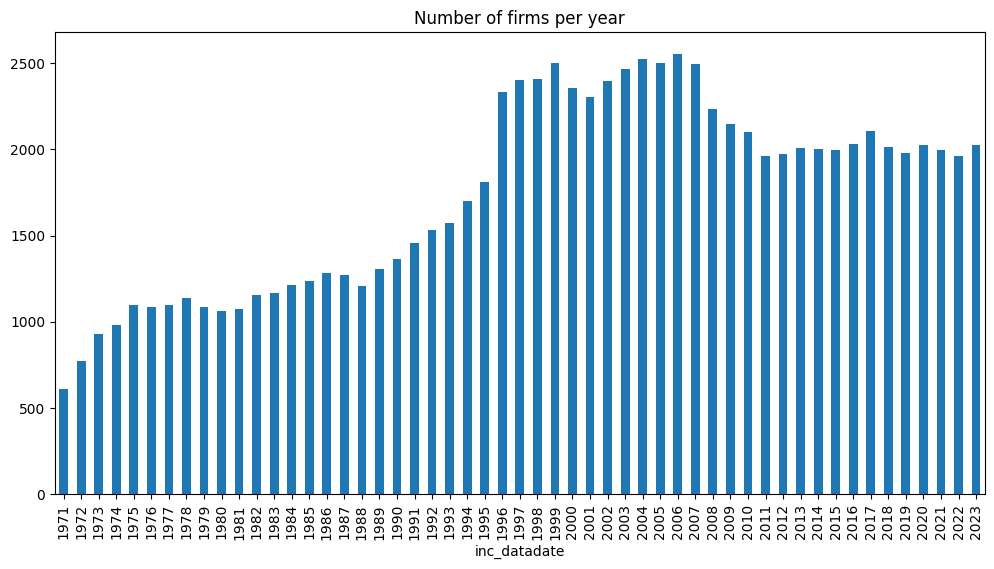

In [ ]:
# Import Matplotlib for plotting
import matplotlib.pyplot as plt

# Convert 'inc_datadate' to datetime format to enable time-based operations
financial_statements["inc_datadate"] = pd.to_datetime(financial_statements["inc_datadate"])

# Create a new figure with custom size (width=12 inches, height=6 inches)
plt.figure(figsize=(12, 6))

# Group data by year (extracted from 'inc_datadate') and count the number of unique firms ('inc_gvkey') per year
(financial_statements
    .groupby(financial_statements.inc_datadate.dt.year)["inc_gvkey"]
    .nunique()                               # Count of unique gvkeys (firms)
    .plot(kind="bar"))                        # Plot as bar chart

# Set the chart title
plt.title("Number of firms per year")

# Display the plot
plt.show()


## The main goal of using a LLM in this exercise is to analyze and predict changes in a company's earnings. This is no simple task: earnings prediction requires both qualitative and quantitative analyses, drawing on data such as financial reports, market news, earnings call transcripts, and more. Let's start by computing the accuracy of a naive model that extrapolates the prior year's change.

In [ ]:
# Step 1: Calculate the actual change in EPS (earnings per share before extraordinary items)
actual = np.sign(
    financial_statements["inc_epsfx"] - financial_statements["inc_lagged_1Y_epsfx"]
)
# → This gives +1 if EPS increased, -1 if it decreased, and 0 if it stayed the same
# → This represents the *true* direction of the EPS change from last year to this year

# Step 2: Calculate the extrapolated trend based on past EPS changes
extrapolated = np.sign(
    financial_statements["inc_lagged_1Y_epsfx"] - financial_statements["inc_lagged_2Y_epsfx"]
)
# → This reflects the *expected* direction of EPS change (based on previous trend)
# → It’s a naive extrapolation: if EPS increased last year, it’s expected to increase again

# Step 3: Measure how often the actual direction matches the extrapolated one
overlaps = (actual == extrapolated).sum() / actual.shape[0]
# → Counts how many times the extrapolated direction correctly predicted the actual one
# → Divides by total number of observations to get a proportion (i.e., accuracy)

# Step 4: Print the resulting accuracy
print("Accuracy for naive (extrapolation) method:", "\n", overlaps)


Accuracy for naive (extrapolation) method: 
 0.4662464681590959


In [ ]:
actual == extrapolated

,0
0,True
1,False
2,False
3,True
4,False
5,True
6,False
7,False
8,False
9,True


## Now is time to play with the LLM! Consistent with US GAAP reporting requirements, we provide two years of balance sheet and three years of income statement data. Before creating them, let's refresh our memory. What are they?

An **income statement** presents a company's revenues, expenses, and net income/losses over a particular period, illustrating how well the company performs operationally. While, a **balance sheet** offers a snapshot of the company's financial position at a specific point in time by listing its assets, liabilities, and shareholders' equity.

In [ ]:
def make_prompt(row):
    """
    Create a prompt for LLM from balance sheet data
    """
    row_reset = row[1].reset_index()                 # Turn a single row into a 2-column DataFrame (column name + value)
    row_reset.columns = ["index", 0]                 # Rename the two columns for clarity

    # Split the original column name into "main" (statement + lag info) and "subfield" (original variable name)
    row_reset[["main", "subfield"]] = row_reset["index"].str.rsplit("_", n=1, expand=True)

    # Further split "main" into "statement" (inc/bal) and "time" (current, lagged_1Y, etc.)
    row_reset[["statement", "time"]] = row_reset["main"].str.split("_", n=1, expand=True)

    row_reset.fillna("current", inplace=True)        # If no lag info, it's the current value

    # Join with the description table to get human-readable names
    row_reset = pd.merge(
        row_reset,
        descr_table,
        left_on=["subfield"],
        right_on=["columnname"],
    )

    # Exclude generic identifiers (e.g. datadate, gvkey)
    row_reset = row_reset.query("subfield not in ['datadate', 'gvkey']")

    # Drop unneeded columns after merging and parsing
    row_reset.drop(
        columns=["index", "columnname", "tablename", "main", "subfield"],
        inplace=True,
    )

    # Pivot income statement to wide format: time on rows, variables on columns
    income_statement = row_reset.query("statement == 'inc'").pivot(
        index="time", columns="description", values=0
    )

    # Define the target: whether EPS (diluted) increased compared to the previous year
    target = np.sign(
        income_statement.loc["current"]
        .loc[income_statement.loc["current"].index.str.contains("diluted", case=False)]
        .item()
        - income_statement.loc["lagged_1Y"]
        .loc[income_statement.loc["lagged_1Y"].index.str.contains("diluted", case=False)]
        .item()
    )

    # Reformat income statement: columns are years (t, t-1, t-2), rows are variables
    income_statement = (
        income_statement.T[["lagged_1Y", "lagged_2Y", "lagged_3Y"]]
    ).rename(columns={"lagged_1Y": "t", "lagged_2Y": "t-1", "lagged_3Y": "t-2"})
    income_statement.index.name = None

    # Do the same for the balance sheet (only up to t-1)
    balance_sheet = (
        row_reset.query("statement == 'bal'")
        .pivot(index="time", columns="description", values=0)
        .T[["lagged_1Y", "lagged_2Y"]]
        .rename(columns={"lagged_1Y": "t", "lagged_2Y": "t-1"})
    )
    balance_sheet.index.name = None

    # Construct the prompt for the language model
    llm_input = (

        "Based on these two financial statements, what's the direction of future earnings? \n"
        +"Extrapolate future earnings from the growth of balance sheet and past earnings and sales."
        +"Ignore the uncertainty. Just look at past earnings and sales and extrapolate even if this is naive!"
        + "Please respond just with either +1 or -1!"
        + "\n\n"
        + "income statement:\n\n"
        + income_statement.to_markdown()              # Convert the income statement to markdown format
        + "\n\nbalance sheet:\n\n"
        + balance_sheet.to_markdown()                 # Convert the balance sheet to markdown format
        + "\n\nAnswer:\n\n"
    )
    return llm_input, target

In [ ]:
# Initialize a dictionary to store model predictions and actual outcomes
statements_dict = defaultdict(list)

# Loop through the first 10 rows of the financial_statements DataFrame
for row in financial_statements.iloc[:3, :].iterrows():
    llm_input, target = make_prompt(row)
    print(llm_input)
    print(target)

Based on these two financial statements, what's the direction of future earnings? 
Extrapolate future earnings from the growth of balance sheet and past earnings and sales.Ignore the uncertainty. Just look at past earnings and sales and extrapolate even if this is naive!Please respond just with either +1 or -1!

income statement:

|                                                                                               |      t |    t-1 |    t-2 |
|:----------------------------------------------------------------------------------------------|-------:|-------:|-------:|
| Cash Dividends Paid                                                                           |  0     |  0     |  0     |
| Common Stock Equivalents - Dollar Savings                                                     |  0     |  0     |  0     |
| Cost of Goods Sold                                                                            | 22.702 | 33.973 | 30.529 |
| Depreciation and Amortization           

<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(
<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(
<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


In [ ]:
# Initialize a dictionary to store model predictions and actual outcomes
statements_dict = defaultdict(list)

# Loop through the first 10 rows of the financial_statements DataFrame
for row in financial_statements.iloc[:3, :].iterrows():
    llm_input, target = make_prompt(row)

    # Tokenize the prompt and move it to the GPU
    input_ids = tokenizer(llm_input, return_tensors="pt").to("cuda")

    # Generate a response from the language model
    outputs = model.generate(**input_ids, max_new_tokens=100)
    print(tokenizer.decode(outputs[0], skip_special_tokens=True))


<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


Based on these two financial statements, what's the direction of future earnings? 
Extrapolate future earnings from the growth of balance sheet and past earnings and sales.Ignore the uncertainty. Just look at past earnings and sales and extrapolate even if this is naive!Please respond just with either +1 or -1!

income statement:

|                                                                                               |      t |    t-1 |    t-2 |
|:----------------------------------------------------------------------------------------------|-------:|-------:|-------:|
| Cash Dividends Paid                                                                           |  0     |  0     |  0     |
| Common Stock Equivalents - Dollar Savings                                                     |  0     |  0     |  0     |
| Cost of Goods Sold                                                                            | 22.702 | 33.973 | 30.529 |
| Depreciation and Amortization           

<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


Based on these two financial statements, what's the direction of future earnings? 
Extrapolate future earnings from the growth of balance sheet and past earnings and sales.Ignore the uncertainty. Just look at past earnings and sales and extrapolate even if this is naive!Please respond just with either +1 or -1!

income statement:

|                                                                                               |      t |    t-1 |    t-2 |
|:----------------------------------------------------------------------------------------------|-------:|-------:|-------:|
| Cash Dividends Paid                                                                           |  0     |  0     |  0     |
| Common Stock Equivalents - Dollar Savings                                                     |  0     |  0     |  0     |
| Cost of Goods Sold                                                                            | 24.704 | 22.702 | 33.973 |
| Depreciation and Amortization           

<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


Based on these two financial statements, what's the direction of future earnings? 
Extrapolate future earnings from the growth of balance sheet and past earnings and sales.Ignore the uncertainty. Just look at past earnings and sales and extrapolate even if this is naive!Please respond just with either +1 or -1!

income statement:

|                                                                                               |      t |    t-1 |    t-2 |
|:----------------------------------------------------------------------------------------------|-------:|-------:|-------:|
| Cash Dividends Paid                                                                           |  0     |  0     |  0     |
| Common Stock Equivalents - Dollar Savings                                                     |  0     |  0     |  0     |
| Cost of Goods Sold                                                                            | 36.646 | 24.704 | 22.702 |
| Depreciation and Amortization           

# Homework: As we can see, most of the time the model keeps producing useless answers. Can you make it work? Below, we use a recursive learning approach: First, we let the LLM process the financial statements. Then, we ask it to determine the sentiment of that processed statement. Experiment with this prompt engineering, try the different techniques from above.

In [ ]:
# Initialize a dictionary to store model predictions and actual outcomes
statements_dict = defaultdict(list)

# Loop through the first 10 rows of the financial_statements DataFrame
for row in financial_statements.iloc[:10, :].iterrows():
    llm_input, target = make_prompt(row)


    # Tokenize the prompt and move it to the GPU
    input_ids = tokenizer(llm_input, return_tensors="pt").to("cuda")

    # Generate a response from the language model
    outputs = model.generate(**input_ids, max_new_tokens=100)

    # Decode and extract the answer portion
    answer_part = tokenizer.decode(outputs[0]).split("Answer:")[-1].strip()

    prompt = 'determine the sentiment of' + answer_part + '. Ignore uncertainty. Respond with +1 or -1. Answer:'
    input_ids = tokenizer(prompt, return_tensors="pt").to("cuda")
    # Generate a response from the language model
    outputs = model.generate(**input_ids, max_new_tokens=100)
    answer_part = tokenizer.decode(outputs[0]).split("Answer:")[-1].strip()

    print(answer_part)

    # Interpret the model's output as +1 or -1 (or None if ambiguous)
    predicted = (
        +1 if "+1" in answer_part or "increase" in answer_part
        else -1 if "-1" in answer_part or "decrease" in answer_part
        else None
    )

    # Save both prediction and target in the result dictionary
    statements_dict["response"].append(predicted)
    statements_dict["target"].append(target)

<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


-1<eos>


<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


-1<eos>


<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


-1<eos>


<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


-1<eos>


<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


-1<eos>


<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


-1<eos>


<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


-1<eos>


<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


+1<eos>


<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


+1<eos>


<ipython-input-39-26cfe6a28085>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  row_reset.drop(


-1<eos>
